# Make a figure with all elemental channels and masks


In [1]:
import sys
if '../' not in sys.path:
    sys.path.append('../')
import tools.roifinder.roif_config
from tools.roifinder.roif_config import *

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

from matplotlib import rc
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path
import seaborn as sns

import tools.roifinder.xrf_roif_internals

from tools.roifinder.xrf_roif_internals import *

import tools.roifinder.xrfm_batches
from tools.roifinder.xrfm_batches import *

import tools.roifinder.fuzzy_kmeans_engine
from tools.roifinder.fuzzy_kmeans_engine import _format_soft_km_axes, soft_clustering_weights

from skimage.filters import sobel

%matplotlib inline

In [4]:
def binary_overlay(idx):

    img=coarse_scans.X_d_K[idx]+coarse_scans.X_d_P[idx]+coarse_scans.X_d_S[idx]+coarse_scans.X_d_Ca[idx]
    # img=coarse_scans.X_d_P[idx]


    img_seg_mask = coarse_scans.X_binary_ero_dil[idx]
    img_normalized = (255*((img - img.min()) / (img.max() - img.min()))).astype(np.uint8)
    img_RGB = np.concatenate([img_normalized[...,np.newaxis]]*3, axis = -1)


    sobel_mag = np.sqrt(sum([sobel(img_seg_mask, axis=i)**2
                             for i in range(img_seg_mask.ndim)]) / img_seg_mask.ndim)
    img_sobel = sobel_mag
    img_sobel = (img_sobel - img_sobel.min()) / (img_sobel.max() - img_sobel.min())
    img_sobel = (255*np.round(img_sobel)).astype(np.uint8)

    img_RGB[img_sobel == 255] = [255,0,0]
    
    return img_RGB

#  import all coarse scans

In [6]:
BASE_PATCH_WIDTH=32
selected_elm_maps=['Cu','Zn','Ca', 'K', 'P', 'S','Fe','Ni','Total_Fluorescence_Yield']
noise_type='none'
base_file_path = '../xrfdata/'


# coarse_scan_names = ['bnp_fly0032.mda.h5']



coarse_scan_names = ['scan1.mda.h5', 
                    'scan2.mda.h5',
                    'scan3.mda.h5',
                    'scan4.mda.h5',
                    'scan5.mda.h5',
                    'scan6.mda.h5',
                    'scan7.mda.h5',
                    'scan8.mda.h5']


# 'bnp_fly0050.mda.h5',
#                     'bnp_fly0051.mda.h5']



hdf5_string_list=['MAPS','MAPS','MAPS','MAPS','MAPS','MAPS','MAPS','MAPS']
norm_ch_list=['US_IC','US_IC','US_IC','US_IC','US_IC','US_IC','US_IC','US_IC']
selected_elm_maps_list=[selected_elm_maps,selected_elm_maps,selected_elm_maps,selected_elm_maps,selected_elm_maps,selected_elm_maps,selected_elm_maps,selected_elm_maps]
noise_type_list = [noise_type,noise_type,noise_type,noise_type,noise_type,noise_type,noise_type,noise_type]
# bin_conv_elm_list=['P', 'P', 'P', 'P', 'P', 'P', 'P', 'P']
bin_conv_elm_list=['KPSCa', 'KPSCa', 'KPSCa', 'KPSCa', 'KPSCa', 'KPSCa', 'KPSCa', 'KPSCa']
apply_gausssian_list=[False, False, False, False,False,False,False,False]
value_offset_list = [1e-12,1e-12,1e-12,1e-12,1e-12,1e-12,1e-12,1e-12]

BASE_PATCH_WIDTH=32
selected_elm_maps=['Cu','Zn','Ca', 'K', 'P', 'S','Fe','Ni','Total_Fluorescence_Yield']
noise_type='none'
base_file_path = '../xrfdata/'



coarse_scans = XRFM_batch(base_file_path,
                  coarse_scan_names,
                 hdf5_string_list,
                 norm_ch_list,
                 selected_elm_maps_list,
                 noise_type_list,
                 bin_conv_elm_list,
                 value_offset_list,
                apply_gausssian_list,
                 BASE_PATCH_WIDTH,
                 print_pv=False,  
                 verbosity=False)

print('Bounding box width and height (pixels):' , BASE_PATCH_WIDTH)
print('Total extracted cells, features:', coarse_scans.X.shape)
print('Total extracted cell, cell size:', coarse_scans.X_bin.shape)



XRF ../xrfdata/scan1.mda.h5
['Cu', 'Zn', 'Ca', 'K', 'P', 'S', 'Fe', 'Ni', 'Total_Fluorescence_Yield']
(41, 14)
XRF ../xrfdata/scan2.mda.h5
['Cu', 'Zn', 'Ca', 'K', 'P', 'S', 'Fe', 'Ni', 'Total_Fluorescence_Yield']
(36, 14)
XRF ../xrfdata/scan3.mda.h5
['Cu', 'Zn', 'Ca', 'K', 'P', 'S', 'Fe', 'Ni', 'Total_Fluorescence_Yield']
(17, 14)
XRF ../xrfdata/scan4.mda.h5
['Cu', 'Zn', 'Ca', 'K', 'P', 'S', 'Fe', 'Ni', 'Total_Fluorescence_Yield']
(19, 14)
XRF ../xrfdata/scan5.mda.h5
['Cu', 'Zn', 'Ca', 'K', 'P', 'S', 'Fe', 'Ni', 'Total_Fluorescence_Yield']
(11, 14)
XRF ../xrfdata/scan6.mda.h5
['Cu', 'Zn', 'Ca', 'K', 'P', 'S', 'Fe', 'Ni', 'Total_Fluorescence_Yield']
(18, 14)
XRF ../xrfdata/scan7.mda.h5
['Cu', 'Zn', 'Ca', 'K', 'P', 'S', 'Fe', 'Ni', 'Total_Fluorescence_Yield']
(16, 14)
XRF ../xrfdata/scan8.mda.h5
['Cu', 'Zn', 'Ca', 'K', 'P', 'S', 'Fe', 'Ni', 'Total_Fluorescence_Yield']
(17, 14)
Bounding box width and height (pixels): 32
Total extracted cells, features: (175, 14)
Total extracted cell, cell

/data02/AZC/ROI-Finder/flx_workflows/xrf_roif_2022.py:106: RuntimeWarning: divide by zero encountered in true_divide
/data02/AZC/ROI-Finder/flx_workflows/xrf_roif_2022.py:106: RuntimeWarning: invalid value encountered in true_divide


# construct dataframe with all the extracted information

In [7]:
principalDf = pd.DataFrame(
             columns = ['Pixel_count', 'area'])


principalDf['area'] = coarse_scans.X[:,0]
principalDf['eccentricity'] = coarse_scans.X[:,1]
principalDf['equivalent_diameter'] = coarse_scans.X[:,2]
principalDf['major_axis_length'] = coarse_scans.X[:,3]
principalDf['minor_axis_length'] = coarse_scans.X[:,4]
principalDf['perimeter'] = coarse_scans.X[:,5]
principalDf['K'] = coarse_scans.X[:,6]
principalDf['P'] = coarse_scans.X[:,7]
principalDf['Ca'] = coarse_scans.X[:,8]
principalDf['Zn'] = coarse_scans.X[:,9]
principalDf['Fe'] = coarse_scans.X[:,10]
principalDf['Cu'] = coarse_scans.X[:,11]
principalDf['BFY'] = coarse_scans.X[:,12]
principalDf['Pixel_count'] = coarse_scans.X[:,13].astype(int)   #Pixel_count column must exist

#add res and origins to dataframe here
#convert from list
principalDf['x_res'] = coarse_scans.X_x_res
principalDf['y_res'] = coarse_scans.X_y_res
principalDf['avg_res'] = coarse_scans.X_avg_res
principalDf['x_origin'] = coarse_scans.X_x_origin
principalDf['y_origin'] = coarse_scans.X_y_origin
principalDf['x_motor'] = coarse_scans.X_x_motor
principalDf['y_motor'] = coarse_scans.X_y_motor
principalDf['xrf_file']=coarse_scans.X_xrf_track_files




#assign scan names in dataframe
number_of_cells = principalDf['xrf_file'].to_numpy().shape[0]
coarse_scan_name=[]
for idx in range(number_of_cells):

    coarse_scan_name.append(os.path.split(principalDf['xrf_file'].to_numpy()[idx])[1])
principalDf['scan_name'] =  np.array(coarse_scan_name)  


display(principalDf)

,Pixel_count,area,eccentricity,equivalent_diameter,major_axis_length,minor_axis_length,perimeter,K,P,Ca,...,BFY,x_res,y_res,avg_res,x_origin,y_origin,x_motor,y_motor,xrf_file,scan_name
0,5,0.3125,0.000000,0.630783,0.632456,0.632456,1.414214,0.000042,0.000038,0.000047,...,0.007212,0.25,0.256287,0.253143,110.674377,-661.065186,139.674377,-655.565186,../xrfdata/scan1.mda.h5,scan1.mda.h5
1,31,1.9375,0.926864,1.570637,2.566840,0.963588,5.242641,0.000042,0.000085,0.000074,...,0.007246,0.25,0.256287,0.253143,110.674377,-661.065186,175.174377,-654.565186,../xrfdata/scan1.mda.h5,scan1.mda.h5
2,5,0.3125,0.000000,0.630783,0.632456,0.632456,1.414214,0.000036,0.000046,0.000051,...,0.007115,0.25,0.256287,0.253143,110.674377,-661.065186,140.174377,-653.815186,../xrfdata/scan1.mda.h5,scan1.mda.h5
3,21,1.3125,0.945323,1.292721,2.313760,0.754599,3.828427,0.000069,0.000055,0.000065,...,0.007196,0.25,0.256287,0.253143,110.674377,-661.065186,121.424377,-652.315186,../xrfdata/scan1.mda.h5,scan1.mda.h5
4,11,0.6875,0.755929,0.935603,1.128152,0.738549,2.414214,0.000046,0.000057,0.000034,...,0.007210,0.25,0.256287,0.253143,110.674377,-661.065186,139.174377,-650.565186,../xrfdata/scan1.mda.h5,scan1.mda.h5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,14,0.8750,0.850688,1.055502,1.465135,0.770179,2.767767,0.000104,0.000051,0.000135,...,0.000799,0.25,0.272903,0.261452,800.212036,-155.992310,801.212036,-123.742310,../xrfdata/scan8.mda.h5,scan8.mda.h5
171,20,1.2500,0.859510,1.261566,1.810667,0.925465,3.828427,0.000111,0.000067,0.000038,...,0.000813,0.25,0.272903,0.261452,800.212036,-155.992310,819.462036,-123.242310,../xrfdata/scan8.mda.h5,scan8.mda.h5
172,34,2.1250,0.939338,1.644881,2.891355,0.991711,5.681981,0.000133,0.000077,0.000038,...,0.000947,0.25,0.272903,0.261452,800.212036,-155.992310,805.462036,-121.242310,../xrfdata/scan8.mda.h5,scan8.mda.h5
173,29,1.8125,0.432967,1.519127,1.606889,1.448465,4.474874,0.000136,0.000089,0.000035,...,0.000954,0.25,0.272903,0.261452,800.212036,-155.992310,812.962036,-119.242310,../xrfdata/scan8.mda.h5,scan8.mda.h5


# remove extracted cells that contain less than certain amount of pixels

In [8]:
secondaryDf=remove_artifacts(principalDf, remove_count = 8)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(secondaryDf)

# secondaryDf.head()

/data02/AZC/ROI-Finder/flx_workflows/xrf_roif_2022.py:865: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,Pixel_count,area,eccentricity,equivalent_diameter,major_axis_length,minor_axis_length,perimeter,K,P,Ca,Zn,Fe,Cu,BFY,x_res,y_res,avg_res,x_origin,y_origin,x_motor,y_motor,xrf_file,scan_name,original index
0,31,1.9375,0.926864,1.570637,2.566840,0.963588,5.242641,0.000042,0.000085,0.000074,0.000071,0.000048,0.000072,0.007246,0.25,0.256287,0.253143,110.674377,-661.065186,175.174377,-654.565186,../xrfdata/scan1.mda.h5,scan1.mda.h5,1
1,21,1.3125,0.945323,1.292721,2.313760,0.754599,3.828427,0.000069,0.000055,0.000065,0.000051,0.000035,0.000046,0.007196,0.25,0.256287,0.253143,110.674377,-661.065186,121.424377,-652.315186,../xrfdata/scan1.mda.h5,scan1.mda.h5,3
2,11,0.6875,0.755929,0.935603,1.128152,0.738549,2.414214,0.000046,0.000057,0.000034,0.000053,0.000040,0.000037,0.007210,0.25,0.256287,0.253143,110.674377,-661.065186,139.174377,-650.565186,../xrfdata/scan1.mda.h5,scan1.mda.h5,4
3,42,2.6250,0.926738,1.828183,3.026790,1.137187,6.389087,0.000054,0.000088,0.000078,0.000055,0.000042,0.000059,0.007298,0.25,0.256287,0.253143,110.674377,-661.065186,178.674377,-648.065186,../xrfdata/scan1.mda.h5,scan1.mda.h5,5
4,18,1.1250,0.722659,1.196827,1.423347,0.983824,3.267767,0.000042,0.000064,0.000100,0.000070,0.000044,0.000052,0.007146,0.25,0.256287,0.253143,110.674377,-661.065186,126.924377,-648.065186,../xrfdata/scan1.mda.h5,scan1.mda.h5,6
5,49,3.0625,0.925859,1.974664,3.245418,1.226342,7.035534,0.000044,0.000089,0.000127,0.000077,0.000041,0.000051,0.007242,0.25,0.256287,0.253143,110.674377,-661.065186,152.424377,-647.565186,../xrfdata/scan1.mda.h5,scan1.mda.h5,7
6,95,5.9375,0.993093,2.749520,8.450952,0.991554,15.906854,0.000055,0.000079,0.000064,0.000049,0.000051,0.000058,0.007374,0.25,0.256287,0.253143,110.674377,-661.065186,134.924377,-643.565186,../xrfdata/scan1.mda.h5,scan1.mda.h5,8
7,38,2.3750,0.927087,1.738949,2.844144,1.066118,5.974874,0.000055,0.000073,0.000113,0.000045,0.000046,0.000046,0.007229,0.25,0.256287,0.253143,110.674377,-661.065186,142.924377,-644.565186,../xrfdata/scan1.mda.h5,scan1.mda.h5,9
8,47,2.9375,0.984730,1.933944,4.921048,0.856704,7.303301,0.000050,0.000099,0.000051,0.000058,0.000039,0.000058,0.007299,0.25,0.256287,0.253143,110.674377,-661.065186,173.174377,-644.065186,../xrfdata/scan1.mda.h5,scan1.mda.h5,10
9,50,3.1250,0.977717,1.994711,4.549151,0.955001,8.010408,0.000050,0.000064,0.000114,0.000078,0.000044,0.000051,0.007258,0.25,0.256287,0.253143,110.674377,-661.065186,112.674377,-642.565186,../xrfdata/scan1.mda.h5,scan1.mda.h5,11


KeyError: 'text_labels'

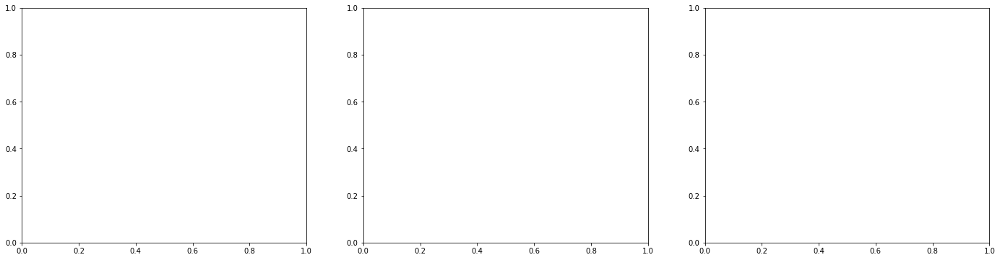

In [9]:
select_feature_channel = 'eccentricity'

# secondaryDf[secondaryDf['text_labels']==0][select_feature_channel]
%matplotlib inline

fig, ax = plt.subplots(1, 3, figsize=(24, 6))

sns.histplot(ax=ax[0],data=secondaryDf[secondaryDf['text_labels']=='Type A'], x=select_feature_channel, kde=True,color='blue')
ax[0].set_title('Type A');

sns.histplot(ax=ax[1],data=secondaryDf[secondaryDf['text_labels']=='Type B'], x=select_feature_channel, kde=True,color='orange')
ax[1].set_title('Type B');

sns.histplot(ax=ax[2],data=secondaryDf[secondaryDf['text_labels']=='Type C'], x=select_feature_channel, kde=True,color='green')
ax[2].set_title('Type C');



# make figures here

type A - blue, type B- orange, type C - green

TypeError: add_axes() missing 1 required positional argument: 'rect'

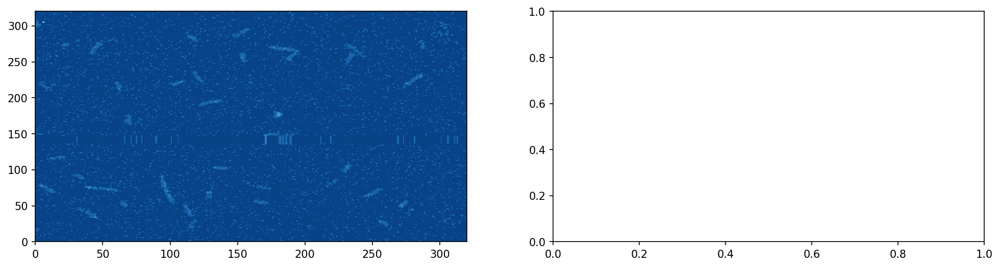

In [10]:
scan_idx = 0

CMAP = 'Blues_r'
inplot_text_xloc=5
inplot_text_yloc=290
inplot_text_fontsize = 22
inplot_text_color = 'white'



fig, ax = plt.subplots(1,2,figsize=(16,4), dpi=150)

img_K=ax[0].contourf(coarse_scans.X_d_K[scan_idx], cmap = CMAP)
# # ax.set_title('K')
# # ax.invert_yaxis()
cax_K = fig.add_axes()
fig.colorbar(img_K, cax = cax_K, orientation='horizontal')
# ax[0].colorbar(img, orientation='vertical')

plt.text(inplot_text_xloc, inplot_text_yloc, 'K', fontsize = inplot_text_fontsize, color = inplot_text_color)


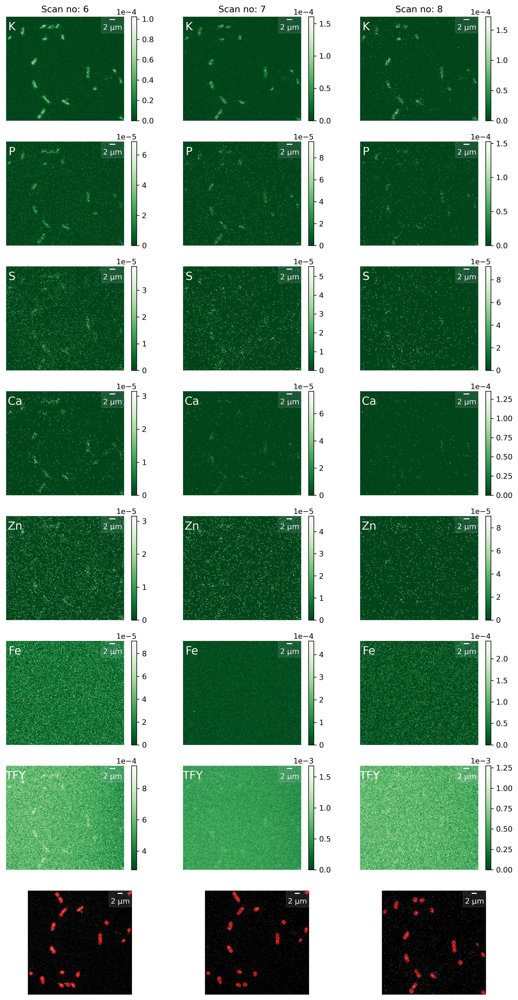

In [11]:
scan_idx = 5
fig, axs = plt.subplots(8, 3, figsize=(12,24), dpi=300)
CMAPS = ['Greens_r']

# K row

ax = axs[0, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_K[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'K', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[0, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_K[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'K', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
ax.set_title('Scan no: '+ str(scan_idx+2))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))

ax = axs[0, 2]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_K[scan_idx+2], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+2], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'K', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
ax.set_title('Scan no: '+ str(scan_idx+3))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# P row

ax = axs[1, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_P[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'P', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[1, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_P[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'P', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[1, 2]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_P[scan_idx+2], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+2], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'P', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+2))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))

# S row

ax = axs[2, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_S[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'S', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[2, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_S[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'S', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[2, 2]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_S[scan_idx+2], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+2], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'S', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+2))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))

# Ca row

ax = axs[3, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Ca[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Ca', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[3, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Ca[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Ca', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[3, 2]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Ca[scan_idx+2], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+2], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Ca', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+2))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))

# Zn row

ax = axs[4, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Zn[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Zn', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[4, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Zn[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Zn', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[4, 2]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Zn[scan_idx+2], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+2], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Zn', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+2))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# Fe row

ax = axs[5, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Fe[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Fe', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[5, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Fe[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Fe', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[5, 2]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Fe[scan_idx+2], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+2], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Fe', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+2))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# TFY row

ax = axs[6, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_TFY[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.080, 0.90, 'TFY', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[6, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_TFY[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.080, 0.90, 'TFY', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[6, 2]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_TFY[scan_idx+2], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+2], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.080, 0.90, 'TFY', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+2))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# binary overlay row

ax = axs[7, 0]
ax.axis('off')
pcm = ax.imshow(binary_overlay(scan_idx))
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
# ax.text(0.080, 0.90, 'mask', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
# fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))
plt.gca().invert_yaxis()

ax = axs[7, 1]
ax.axis('off')
pcm = ax.imshow(binary_overlay(scan_idx+1))
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
# ax.text(0.080, 0.90, 'mask', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
# fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))
plt.gca().invert_yaxis()

ax = axs[7, 2]
ax.axis('off')
pcm = ax.imshow(binary_overlay(scan_idx+2))
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+2], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
# ax.text(0.080, 0.90, 'mask', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+2))
# fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))
plt.gca().invert_yaxis()

plt.show()


In [37]:
binary_overlay(5).shape

(163, 163, 3)

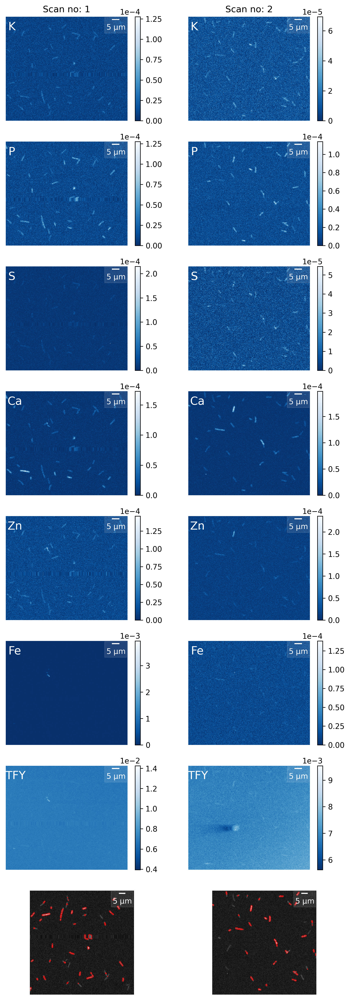

In [38]:
scan_idx = 0
fig, axs = plt.subplots(8, 2, figsize=(8,24), dpi=300)
CMAPS = ['Blues_r']

# K row

ax = axs[0, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_K[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'K', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[0, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_K[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'K', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
ax.set_title('Scan no: '+ str(scan_idx+2))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))



# P row

ax = axs[1, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_P[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'P', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[1, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_P[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'P', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# S row

ax = axs[2, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_S[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'S', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[2, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_S[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'S', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))



# Ca row

ax = axs[3, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Ca[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Ca', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[3, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Ca[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Ca', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))



# Zn row

ax = axs[4, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Zn[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Zn', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[4, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Zn[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Zn', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))




# Fe row

ax = axs[5, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Fe[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Fe', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[5, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Fe[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Fe', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))




# TFY row

ax = axs[6, 0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_TFY[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.080, 0.90, 'TFY', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


ax = axs[6, 1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_TFY[scan_idx+1], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.080, 0.90, 'TFY', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))




# binary overlay row

ax = axs[7, 0]
ax.axis('off')
pcm = ax.imshow(binary_overlay(scan_idx))
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
# ax.text(0.080, 0.90, 'mask', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
# fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))
plt.gca().invert_yaxis()

ax = axs[7, 1]
ax.axis('off')
pcm = ax.imshow(binary_overlay(scan_idx+1))
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
# ax.text(0.080, 0.90, 'mask', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx+1))
# fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))
plt.gca().invert_yaxis()


plt.show()


# use the following with Blues_r, Oranges_r and Greens_r for scans 1,2,4

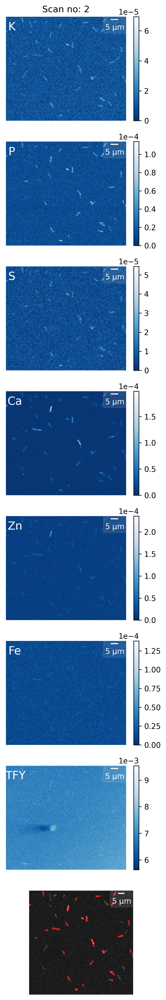

In [45]:
# pick scan 4 from here
scan_idx = 1
fig, axs = plt.subplots(8, figsize=(3.6,24), dpi=300)
CMAPS = ['Blues_r']

# K row

ax = axs[0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_K[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'K', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
ax.set_title('Scan no: '+ str(scan_idx+ 1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# P row

ax = axs[1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_P[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'P', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))




# S row

ax = axs[2]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_S[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'S', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))




# Ca row

ax = axs[3]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Ca[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Ca', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))




# Zn row

ax = axs[4]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Zn[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Zn', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# Fe row

ax = axs[5]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Fe[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Fe', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# TFY row

ax = axs[6]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_TFY[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.080, 0.90, 'TFY', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# binary overlay row

ax = axs[7]
ax.axis('off')
pcm = ax.imshow(binary_overlay(scan_idx))
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
# ax.text(0.080, 0.90, 'mask', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
# fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))
plt.gca().invert_yaxis()

# ax = axs[7, 1]
# ax.axis('off')
# pcm = ax.imshow(binary_overlay(scan_idx+1))
# ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
# # ax.text(0.080, 0.90, 'mask', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# # ax.set_title('Scan no: '+ str(scan_idx+1))
# # fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))
# plt.gca().invert_yaxis()


plt.show()


# make scans 3 and 5

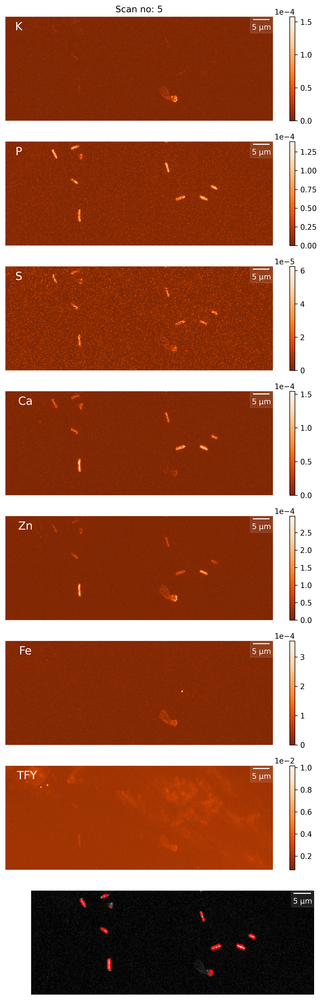

In [50]:
scan_idx = 4
fig, axs = plt.subplots(8, figsize=(8,24), dpi=300)
CMAPS = ['Oranges_r']

# K row

ax = axs[0]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_K[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'K', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
ax.set_title('Scan no: '+ str(scan_idx+ 1))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# P row

ax = axs[1]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_P[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'P', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))




# S row

ax = axs[2]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_S[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.05, 0.90, 'S', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))




# Ca row

ax = axs[3]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Ca[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Ca', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))




# Zn row

ax = axs[4]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Zn[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Zn', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# Fe row

ax = axs[5]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_Fe[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.075, 0.90, 'Fe', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# TFY row

ax = axs[6]
ax.axis('off')
pcm = ax.pcolormesh(coarse_scans.X_d_TFY[scan_idx], cmap = CMAPS[0])
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
ax.text(0.080, 0.90, 'TFY', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))


# binary overlay row

ax = axs[7]
ax.axis('off')
pcm = ax.imshow(binary_overlay(scan_idx))
ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
# ax.text(0.080, 0.90, 'mask', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# ax.set_title('Scan no: '+ str(scan_idx))
# fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))
plt.gca().invert_yaxis()

# ax = axs[7, 1]
# ax.axis('off')
# pcm = ax.imshow(binary_overlay(scan_idx+1))
# ax.add_artist(ScaleBar(coarse_scans.X_x_res[scan_idx+1], units = "um", color='white', length_fraction=0.1, box_alpha=0.10))
# # ax.text(0.080, 0.90, 'mask', fontsize=15, color ='white', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
# # ax.set_title('Scan no: '+ str(scan_idx+1))
# # fig.colorbar(pcm, ax=ax).ax.ticklabel_format(style='sci', scilimits=(-2,2))
# plt.gca().invert_yaxis()


plt.show()
